In [1]:
from dotenv import load_dotenv

load_dotenv()

True

# 0) 그래프 State 정의

In [2]:
from typing import TypedDict, Annotated, List, Dict
import operator
from langchain_core.documents import Document


class GraphState(TypedDict):
    filepath: Annotated[str, "filepath"]  # 원본 파일 경로
    
    analyzed_files : Annotated[List, "analyzed_files"]

    metadata: Annotated[List[Dict], operator.add]  # parsing metadata (api, model, usage)
    
    elements_from_parser: Annotated[List[Dict], "elements_from_parser"]  


In [3]:
state = GraphState(filepath='C:/Users/user/Desktop/BOAZ_ADV/Wang_Gyu/GUIDELINES')
state

{'filepath': 'C:/Users/user/Desktop/BOAZ_ADV/Wang_Gyu/GUIDELINES'}

# 1) PDF split

- 몇 페이지씩 자를 것인가?
- upstage는 한번에 100페에지까지만 처리 가능
- 논문이 짧아서 굳이 안잘라도 될듯

In [ ]:
import pymupdf
import os

def split_pdf_by_batch(file_path, batch_size):
    # PDF 파일 열기
    input_pdf = pymupdf.open(file_path)
    num_pages = len(input_pdf)
    print(f"총 페이지 수: {num_pages}")

    # 출력 디렉토리: 원본 파일이 있는 디렉토리 내의 "split_docs" 폴더 생성
    output_dir = os.path.join(os.path.dirname(file_path), "split_docs")
    os.makedirs(output_dir, exist_ok=True)

    ret = []
    base_name = os.path.splitext(os.path.basename(file_path))[0]

    # PDF 분할: batch_size 만큼의 페이지씩 분할
    for start_page in range(0, num_pages, batch_size):
        end_page = min(start_page + batch_size, num_pages) - 1
        output_file = os.path.join(output_dir, f"{base_name}_{start_page:04d}_{end_page:04d}.pdf")
        print(f"분할 PDF 생성: {output_file}")
        
        with pymupdf.open() as output_pdf:
            output_pdf.insert_pdf(input_pdf, from_page=start_page, to_page=end_page)
            output_pdf.save(output_file)
        ret.append(output_file)

    input_pdf.close()
    return ret

split_pdf_by_batch(file_path="C:/Users/user/Desktop/BOAZ_ADV/Wang_Gyu/1-s2.0-S0952818016300204-main.pdf",
                   batch_size=6)

# 2) Upstage Document parser 이용해 layout 분석

In [4]:
import requests
import json
import os

DEFAULT_CONFIG = {
    "ocr": False,
    "coordinates": True,
    "output_formats": "['html', 'text', 'markdown']",
    "model": "document-parse",
    "base64_encoding": "['figure', 'chart', 'table']",
}

def analyze_layout(state: GraphState):
    """
    분할된 PDF 파일들을 Upstage API로 전송하여 레이아웃 분석을 수행하고,
    결과 JSON 파일들을 저장하는 함수.

    Returns:
    - list: 성공적으로 분석된 파일들의 결과 JSON 파일 경로 목록.
    """
    docs_folder = state['filepath']

    output_folder = os.path.join(docs_folder, "analysis_results")
    os.makedirs(output_folder, exist_ok=True)
    
    api_url = "https://api.upstage.ai/v1/document-ai/document-parse"
    api_key = os.environ.get("UPSTAGE_API_KEY")
    # split_docs 폴더 내의 모든 PDF 파일 가져오기
    pdf_files = [f for f in os.listdir(docs_folder) if f.endswith(".pdf")]
    output_paths = []
    metadata_list = []
    
    for pdf_file in pdf_files:
        file_path = os.path.join(docs_folder, pdf_file)
        output_json_path = os.path.join(output_folder, f"{os.path.splitext(pdf_file)[0]}.json")
        print(f"📤 파일 업로드 중: {pdf_file}")
        
        with open(file_path, "rb") as pdf:
            response = requests.post(
                api_url,
                headers={"Authorization": f"Bearer {api_key}"},
                data=DEFAULT_CONFIG,
                files={"document": pdf}
            )
        
        # 응답 확인 및 JSON 파일 저장
        if response.status_code == 200:
            result = response.json()
            with open(output_json_path, "w", encoding="utf-8") as json_file:
                json.dump(result, json_file, ensure_ascii=False, indent=4)
            print(f"✅ 분석 결과 저장 완료: {output_json_path}")
            output_paths.append(output_json_path)
            meta = {
                "id": pdf_file,
                "model": result.get("model"),
                "usage": result.get("usage")
            }
            metadata_list.append(meta)
        else:
            print(f"❌ 오류 발생 ({response.status_code}): {response.text}")
    
    print("🎉 모든 파일 분석 완료!")
    return GraphState(metadata=metadata_list,
                      analyzed_files=output_paths)

In [5]:
state_out = analyze_layout(state)
state.update(state_out)
state

📤 파일 업로드 중: 1-s2.0-S0952818016300204-main.pdf
✅ 분석 결과 저장 완료: C:/Users/user/Desktop/BOAZ_ADV/Wang_Gyu/GUIDELINES\analysis_results\1-s2.0-S0952818016300204-main.json
📤 파일 업로드 중: 1-s2.0-S0952818022000101-main.pdf
✅ 분석 결과 저장 완료: C:/Users/user/Desktop/BOAZ_ADV/Wang_Gyu/GUIDELINES\analysis_results\1-s2.0-S0952818022000101-main.json
📤 파일 업로드 중: 1-s2.0-S0952818022003701-main.pdf
✅ 분석 결과 저장 완료: C:/Users/user/Desktop/BOAZ_ADV/Wang_Gyu/GUIDELINES\analysis_results\1-s2.0-S0952818022003701-main.json
📤 파일 업로드 중: 1-s2.0-S0952818024000333-main.pdf
✅ 분석 결과 저장 완료: C:/Users/user/Desktop/BOAZ_ADV/Wang_Gyu/GUIDELINES\analysis_results\1-s2.0-S0952818024000333-main.json
📤 파일 업로드 중: 1-s2.0-S0952818024001375-main.pdf
✅ 분석 결과 저장 완료: C:/Users/user/Desktop/BOAZ_ADV/Wang_Gyu/GUIDELINES\analysis_results\1-s2.0-S0952818024001375-main.json
📤 파일 업로드 중: 1-s2.0-S2352556824000626-main.pdf
✅ 분석 결과 저장 완료: C:/Users/user/Desktop/BOAZ_ADV/Wang_Gyu/GUIDELINES\analysis_results\1-s2.0-S2352556824000626-main.json
🎉 모든 파일 분석 완료!


{'filepath': 'C:/Users/user/Desktop/BOAZ_ADV/Wang_Gyu/GUIDELINES',
 'metadata': [{'id': '1-s2.0-S0952818016300204-main.pdf',
   'model': 'document-parse-250116',
   'usage': {'pages': 12}},
  {'id': '1-s2.0-S0952818022000101-main.pdf',
   'model': 'document-parse-250116',
   'usage': {'pages': 9}},
  {'id': '1-s2.0-S0952818022003701-main.pdf',
   'model': 'document-parse-250116',
   'usage': {'pages': 9}},
  {'id': '1-s2.0-S0952818024000333-main.pdf',
   'model': 'document-parse-250116',
   'usage': {'pages': 6}},
  {'id': '1-s2.0-S0952818024001375-main.pdf',
   'model': 'document-parse-250116',
   'usage': {'pages': 10}},
  {'id': '1-s2.0-S2352556824000626-main.pdf',
   'model': 'document-parse-250116',
   'usage': {'pages': 13}}],
 'analyzed_files': ['C:/Users/user/Desktop/BOAZ_ADV/Wang_Gyu/GUIDELINES\\analysis_results\\1-s2.0-S0952818016300204-main.json',
  'C:/Users/user/Desktop/BOAZ_ADV/Wang_Gyu/GUIDELINES\\analysis_results\\1-s2.0-S0952818022000101-main.json',
  'C:/Users/user/De

# 3) 각 파일들의 elements만 저장

- {"파일명" : elements}

In [6]:
def load_elements(state: GraphState):
    """
    분석된 JSON 파일들에서 각 파일의 'elements' 데이터를 읽어와서,
    state의 'elements' 키에 딕셔너리 형태로 저장합니다.
    
    각 딕셔너리의 key는 JSON 파일의 파일명(예: "파일명.json")이며,
    value는 해당 파일의 elements 리스트입니다.
    
    Parameters:
      state (GraphState): 
          - filepath: 원본 파일 경로 (분석할 폴더)
          - analyzed_files: analyze_layout 함수로 생성된 결과 JSON 파일 경로 목록
          그 외 기타 state 항목들
      
    Returns:
      GraphState: 업데이트된 state (추가된 "elements" 키 포함)
    """
    elements_dict = {}
    for json_file in state.get("analyzed_files", []):
        file_name = os.path.basename(json_file)
        with open(json_file, "r", encoding="utf-8") as f:
            json_data = json.load(f)
        # JSON 파일에 "elements" 키가 있다고 가정
        elements = json_data.get("elements", [])
        elements_dict[file_name] = elements

    return GraphState(elements_from_parser=elements_dict)

In [7]:
state_out = load_elements(state)
state.update(state_out)
state['elements_from_parser']

{'1-s2.0-S0952818016300204-main.json': [{'category': 'header',
   'content': {'html': "<header id='0' style='font-size:14px'>Journal of Clinical Anesthesia (2016) 32, 224–235</header>",
    'markdown': 'Journal of Clinical Anesthesia (2016) 32, 224–235',
    'text': 'Journal of Clinical Anesthesia (2016) 32, 224–235'},
   'coordinates': [{'x': 0.0712, 'y': 0.0414},
    {'x': 0.341, 'y': 0.0414},
    {'x': 0.341, 'y': 0.0534},
    {'x': 0.0712, 'y': 0.0534}],
   'id': 0,
   'page': 1},
  {'base64_encoding': '/9j/2wCEAAIBAQEBAQIBAQECAgICAgQDAgICAgUEBAMEBgUGBgYFBgYGBwkIBgcJBwYGCAsICQoKCgoKBggLDAsKDAkKCgoBAgICAgICBQMDBQoHBgcKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCv/AABEIAIUAdwMBIgACEQEDEQH/xAGiAAABBQEBAQEBAQAAAAAAAAAAAQIDBAUGBwgJCgsQAAIBAwMCBAMFBQQEAAABfQECAwAEEQUSITFBBhNRYQcicRQygZGhCCNCscEVUtHwJDNicoIJChYXGBkaJSYnKCkqNDU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6g4SFhoeIiYqSk5SVlpeYmZqio6Slpqeoqaqys7S1tre4ubrCw8TFxsfIycrS09TV1tfY2drh4uPk5ebn6Onq8fLz9PX29/j

In [8]:
state["elements_from_parser"].keys()

dict_keys(['1-s2.0-S0952818016300204-main.json', '1-s2.0-S0952818022000101-main.json', '1-s2.0-S0952818022003701-main.json', '1-s2.0-S0952818024000333-main.json', '1-s2.0-S0952818024001375-main.json', '1-s2.0-S2352556824000626-main.json'])

# 4) 이미지 추출

- category가 chart / figure / table인 녀석들만 png로 추출
- elements_from_parser에 png_filepath키 값 추가해서 경로도 저장함

In [9]:
import os
import io
import base64
from PIL import Image

def export_images(state: GraphState):
    """
    문서에서 추출한 이미지를 PNG 파일로 저장하고,
    state["elements_from_parser"]의 각 요소에 저장된 이미지 파일 경로를 'png_filepath' 필드에 추가합니다.
    
    Parameters:
      state (dict): 
          - "filepath": 원본 파일 경로 (이미지가 저장될 상위 경로)
          - "elements_from_parser": 파서에서 추출한 요소 리스트. 각 요소는 dict이며, 
            'category', 'page', 'id', 'base64_encoding' 등의 키를 포함합니다.
    
    Returns:
      dict: 업데이트된 state 딕셔너리 (특히 "elements_from_parser"가 업데이트됨)
    """
    filepath = state["filepath"]
    
    basename = os.path.basename(filepath)
    
    # 파일.json 별로 돌고
    for elem in state["elements_from_parser"]:
        
        for i in range(len(state['elements_from_parser'][elem])):

          category = state["elements_from_parser"][elem][i]["category"]
          page = state["elements_from_parser"][elem][i]["page"]
          id = state["elements_from_parser"][elem][i]["id"]

          if category in ["figure", "chart", "table"]:
              base64_encoding = state["elements_from_parser"][elem][i]["base64_encoding"]
              if base64_encoding:
                  
                  # base64 디코딩 및 이미지 변환
                  image_data = base64.b64decode(base64_encoding)
                  image = Image.open(io.BytesIO(image_data))
                  
                  # 저장할 디렉토리: filepath/images/{elem}/{category}
                  image_dir = os.path.join(filepath, "images", elem, category)
                  os.makedirs(image_dir, exist_ok=True)
                  
                  # 파일명 생성: {BASENAME}_{CATEGORY}_Page_{page+1}_Index_{id}.png
                  base_prefix = os.path.splitext(basename)[0]
                  image_filename = (
                      f"{base_prefix.upper()}_{category.upper()}_Page_{page}_Index_{id}.png"
                  )
                  image_path = os.path.join(image_dir, image_filename)
                  abs_image_path = os.path.abspath(image_path)
                  
                  # 이미지 저장
                  image.save(abs_image_path)
                  state["elements_from_parser"][elem][i]["png_filepath"] = abs_image_path

    return {"elements_from_parser": state["elements_from_parser"]}


In [10]:
state_out = export_images(state)
state.update(state_out)
state['elements_from_parser']

{'1-s2.0-S0952818016300204-main.json': [{'category': 'header',
   'content': {'html': "<header id='0' style='font-size:14px'>Journal of Clinical Anesthesia (2016) 32, 224–235</header>",
    'markdown': 'Journal of Clinical Anesthesia (2016) 32, 224–235',
    'text': 'Journal of Clinical Anesthesia (2016) 32, 224–235'},
   'coordinates': [{'x': 0.0712, 'y': 0.0414},
    {'x': 0.341, 'y': 0.0414},
    {'x': 0.341, 'y': 0.0534},
    {'x': 0.0712, 'y': 0.0534}],
   'id': 0,
   'page': 1},
  {'base64_encoding': '/9j/2wCEAAIBAQEBAQIBAQECAgICAgQDAgICAgUEBAMEBgUGBgYFBgYGBwkIBgcJBwYGCAsICQoKCgoKBggLDAsKDAkKCgoBAgICAgICBQMDBQoHBgcKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCv/AABEIAIUAdwMBIgACEQEDEQH/xAGiAAABBQEBAQEBAQAAAAAAAAAAAQIDBAUGBwgJCgsQAAIBAwMCBAMFBQQEAAABfQECAwAEEQUSITFBBhNRYQcicRQygZGhCCNCscEVUtHwJDNicoIJChYXGBkaJSYnKCkqNDU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6g4SFhoeIiYqSk5SVlpeYmZqio6Slpqeoqaqys7S1tre4ubrCw8TFxsfIycrS09TV1tfY2drh4uPk5ebn6Onq8fLz9PX29/j

# 5) 표 csv로 저장

In [11]:
import os
import pandas as pd
from bs4 import BeautifulSoup
from io import StringIO

def export_table_csv(state: GraphState) :
    """
    문서에서 추출한 테이블을 CSV 형식으로 저장하고,
    각 table 요소에 대해 "table_csv_path" 키에 CSV 파일 경로를 추가합니다.
    
    state["filepath"] 내부에 "table_csv" 폴더를 생성하여 CSV 파일들을 저장합니다.
    
    Parameters:
      state (dict): 
          - "filepath": 원본 파일 경로 (예: samsung 폴더 경로)
          - "elements_from_parser": 파서에서 추출한 요소 리스트. 각 요소는 dict이며, 
            'category', 'page', 'id', 'content' (HTML 문자열 포함) 등의 키를 포함합니다.
    
    Returns:
      dict: 업데이트된 state 딕셔너리 (특히 각 table 요소에 "table_csv_path" 추가)
    """

    docs_folder = state["filepath"]

    # docs_folder 내부에 table_csv 폴더 생성
    table_dir = os.path.join(docs_folder, "table_csv")
    os.makedirs(table_dir, exist_ok=True)
    
    # 폴더명(예: samsung)을 파일명 생성에 활용 (대문자 변환)
    base_without_ext = os.path.basename(docs_folder)
    
    for elem in state["elements_from_parser"]:

        # 각 elem 별 폴더 생성 (예: table_csv/some_elem)
        elem_dir = os.path.join(table_dir, elem)
        os.makedirs(elem_dir, exist_ok=True)

        for i in range(len(state['elements_from_parser'][elem])):

            category = state["elements_from_parser"][elem][i]["category"]
            page = state["elements_from_parser"][elem][i]["page"]
            id = state["elements_from_parser"][elem][i]["id"]
            html = state["elements_from_parser"][elem][i]['content']['html']

            if category == "table":
                try:
                    # HTML 형식의 테이블 파싱
                    soup = BeautifulSoup(html, "html.parser")
                    
                    # <td> 태그의 불필요한 탭 문자 및 공백 제거
                    for td in soup.find_all("td"):
                        if td.string:
                            td.string = td.get_text(strip=True).replace("\\t", " ").replace("\t", " ")
                    
                    # 정리된 HTML을 문자열로 변환 후 StringIO 객체 생성
                    cleaned_html = str(soup)
                    cleaned_html_io = StringIO(cleaned_html)
                    
                    # pandas로 HTML 테이블 파싱 (여러 테이블이 반환될 수 있음)
                    parsed_tables = pd.read_html(cleaned_html_io)
                    for table in parsed_tables:
                        # CSV 파일명 생성: SAMSUNG_TABLE_Page_{page}_Index_{id}.csv
                        csv_filename = f"{base_without_ext.upper()}_TABLE_Page_{page}_Index_{id}.csv"
                        csv_filepath = os.path.join(elem_dir, csv_filename)
                        absolute_path = os.path.abspath(csv_filepath)
                        
                        # CSV 파일로 저장
                        table.to_csv(absolute_path, index=False, encoding="utf-8-sig")
                        print(f"CSV 파일이 성공적으로 생성되었습니다: {absolute_path}")
                        
                        # 각 요소에 CSV 파일 경로 저장 (여러 테이블이 있으면 마지막 결과로 덮어씌워짐)
                        state["elements_from_parser"][elem][i]["table_csv_path"] = absolute_path
                except Exception as e:
                    print(f"테이블 파싱 중 오류 발생: {str(e)}")
                    continue
    
    return {"elements_from_parser": state["elements_from_parser"]}

In [12]:
state_out = export_table_csv(state)
state.update(state_out)
state['elements_from_parser']

CSV 파일이 성공적으로 생성되었습니다: C:\Users\user\Desktop\BOAZ_ADV\Wang_Gyu\GUIDELINES\table_csv\1-s2.0-S0952818016300204-main.json\GUIDELINES_TABLE_Page_3_Index_30.csv
CSV 파일이 성공적으로 생성되었습니다: C:\Users\user\Desktop\BOAZ_ADV\Wang_Gyu\GUIDELINES\table_csv\1-s2.0-S0952818016300204-main.json\GUIDELINES_TABLE_Page_3_Index_39.csv
CSV 파일이 성공적으로 생성되었습니다: C:\Users\user\Desktop\BOAZ_ADV\Wang_Gyu\GUIDELINES\table_csv\1-s2.0-S0952818016300204-main.json\GUIDELINES_TABLE_Page_6_Index_69.csv
CSV 파일이 성공적으로 생성되었습니다: C:\Users\user\Desktop\BOAZ_ADV\Wang_Gyu\GUIDELINES\table_csv\1-s2.0-S0952818016300204-main.json\GUIDELINES_TABLE_Page_7_Index_81.csv
CSV 파일이 성공적으로 생성되었습니다: C:\Users\user\Desktop\BOAZ_ADV\Wang_Gyu\GUIDELINES\table_csv\1-s2.0-S0952818022000101-main.json\GUIDELINES_TABLE_Page_3_Index_50.csv
CSV 파일이 성공적으로 생성되었습니다: C:\Users\user\Desktop\BOAZ_ADV\Wang_Gyu\GUIDELINES\table_csv\1-s2.0-S0952818022000101-main.json\GUIDELINES_TABLE_Page_5_Index_80.csv
CSV 파일이 성공적으로 생성되었습니다: C:\Users\user\Desktop\BOAZ_ADV\Wang_Gyu\G

{'1-s2.0-S0952818016300204-main.json': [{'category': 'header',
   'content': {'html': "<header id='0' style='font-size:14px'>Journal of Clinical Anesthesia (2016) 32, 224–235</header>",
    'markdown': 'Journal of Clinical Anesthesia (2016) 32, 224–235',
    'text': 'Journal of Clinical Anesthesia (2016) 32, 224–235'},
   'coordinates': [{'x': 0.0712, 'y': 0.0414},
    {'x': 0.341, 'y': 0.0414},
    {'x': 0.341, 'y': 0.0534},
    {'x': 0.0712, 'y': 0.0534}],
   'id': 0,
   'page': 1},
  {'base64_encoding': '/9j/2wCEAAIBAQEBAQIBAQECAgICAgQDAgICAgUEBAMEBgUGBgYFBgYGBwkIBgcJBwYGCAsICQoKCgoKBggLDAsKDAkKCgoBAgICAgICBQMDBQoHBgcKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCv/AABEIAIUAdwMBIgACEQEDEQH/xAGiAAABBQEBAQEBAQAAAAAAAAAAAQIDBAUGBwgJCgsQAAIBAwMCBAMFBQQEAAABfQECAwAEEQUSITFBBhNRYQcicRQygZGhCCNCscEVUtHwJDNicoIJChYXGBkaJSYnKCkqNDU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6g4SFhoeIiYqSk5SVlpeYmZqio6Slpqeoqaqys7S1tre4ubrCw8TFxsfIycrS09TV1tfY2drh4uPk5ebn6Onq8fLz9PX29/j

In [13]:
state['elements_from_parser'].keys()

dict_keys(['1-s2.0-S0952818016300204-main.json', '1-s2.0-S0952818022000101-main.json', '1-s2.0-S0952818022003701-main.json', '1-s2.0-S0952818024000333-main.json', '1-s2.0-S0952818024001375-main.json', '1-s2.0-S2352556824000626-main.json'])

In [14]:
state['elements_from_parser']['1-s2.0-S0952818016300204-main.json']

[{'category': 'header',
  'content': {'html': "<header id='0' style='font-size:14px'>Journal of Clinical Anesthesia (2016) 32, 224–235</header>",
   'markdown': 'Journal of Clinical Anesthesia (2016) 32, 224–235',
   'text': 'Journal of Clinical Anesthesia (2016) 32, 224–235'},
  'coordinates': [{'x': 0.0712, 'y': 0.0414},
   {'x': 0.341, 'y': 0.0414},
   {'x': 0.341, 'y': 0.0534},
   {'x': 0.0712, 'y': 0.0534}],
  'id': 0,
  'page': 1},
 {'base64_encoding': '/9j/2wCEAAIBAQEBAQIBAQECAgICAgQDAgICAgUEBAMEBgUGBgYFBgYGBwkIBgcJBwYGCAsICQoKCgoKBggLDAsKDAkKCgoBAgICAgICBQMDBQoHBgcKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCv/AABEIAIUAdwMBIgACEQEDEQH/xAGiAAABBQEBAQEBAQAAAAAAAAAAAQIDBAUGBwgJCgsQAAIBAwMCBAMFBQQEAAABfQECAwAEEQUSITFBBhNRYQcicRQygZGhCCNCscEVUtHwJDNicoIJChYXGBkaJSYnKCkqNDU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6g4SFhoeIiYqSk5SVlpeYmZqio6Slpqeoqaqys7S1tre4ubrCw8TFxsfIycrS09TV1tfY2drh4uPk5ebn6Onq8fLz9PX29/j5+gEAAwEBAQEBAQEBAQAAAAAAAAECAwQFBgcICQoLEQACAQIE

# 6) Documents 구성

- metadata : document_name, page, summary
- content : markdown

- **analysis_results 파일 바로 쓰기**

In [1]:
import os
import json
import glob

folder_path = 'C:/Users/user/Desktop/BOAZ_ADV/Wang_Gyu/GUIDELINES/analysis_results'

json_files = glob.glob(os.path.join(folder_path,'*.json'))

json_data = {}
for filename in os.listdir(folder_path):
    if filename.endswith('.json'):
        file_path = os.path.join(folder_path,filename)
        
        with open(file_path, 'r', encoding='utf-8') as file:
            json_data[filename] = json.load(file)

print(json_data.keys())

dict_keys(['1-s2.0-S0952818016300204-main.json', '1-s2.0-S0952818022000101-main.json', '1-s2.0-S0952818022003701-main.json', '1-s2.0-S0952818024000333-main.json', '1-s2.0-S0952818024001375-main.json', '1-s2.0-S2352556824000626-main.json'])


In [2]:
from langchain_core.documents import Document

# 페이지로 합치기
documents = []

for file_name,data in json_data.items():
    elements = data['elements']

    page_content = {}

    for elem in elements:

        if elem['category'] in ('footer','footnote','header'):
            continue

        page = elem['page']
        content = elem['content']['markdown']

        if page in page_content:
            page_content[page] += "\n" + content
        else:
            page_content[page] = content

    for page,combined_content in page_content.items():
        metadata = {'document_name' : file_name,
                    'page' : page}
        documents.append(Document(metadata=metadata, page_content=combined_content))

documents

[Document(metadata={'document_name': '1-s2.0-S0952818016300204-main.json', 'page': 1}, page_content='![image](/image/placeholder)\n\n# Review\nUse of direct oral anticoagulants with regional\nanesthesia in orthopedic patients☆\nGianluca Cappelleri MD a,⁎, Andrea Fanelli MD b\naAnaesthesia and Intensive Care Unit, Azienda Ospedaliera Istituto Ortopedico Gaetano Pini, 20122, Milan, Italy\nbAnaesthesia and Intensive Care Unit, Policlinico S. Orsola-Malpighi, 40138, Bologna, Italy\nReceived 28 May 2015; revised 5 January 2016; accepted 22 February 2016\nKeywords:\nDirect oral anticoagulant;\nMajor orthopedic surgery;\nNeuraxial anesthesia;\nPerioperative management;\nPostoperative management\nAbstract The use of direct oral anticoagulants including apixaban, rivaroxaban, and dabigatran, which are\napproved for several therapeutic indications, can simplify perioperative and postoperative management\nof anticoagulation. Utilization of regional neuraxial anesthesia in patients receiving antic

In [ ]:
# 페이지별 summary를 생성해서 metadata에 넣어주자
from langchain_openai import ChatOpenAI
import openai

api_key = os.environ['OPENAI_API_KEY']
openai.api_key = api_key

system_prompt = """You are an expert who reads documents thoroughly and provides accurate summaries. 
The document you will read is a **medical research paper**. 
If you find that the document has missing parts at the beginning or the end, focus on summarizing the middle content. 
Since the summary you generate will later be used for retrieval to answer user queries, do not add any personal insights beyond the document's content—simply summarize it as it is.
Also, provide five hypothetical questions based on the image that users can ask.
"""

# 생성된 결과를 담을 리스트를 초기화합니다.
generated_documents = []

for doc in documents:
    context = doc.page_content
    doc_name = doc.metadata['document_name']
    doc_page = doc.metadata['page']

    user_prompt_template = f"""This is the document you will summarize.: {context}
###
Output Format:

<summary>
[summary]
</summary>
<hypothetical_questions>
[hypothetical_questions]
</hypothetical_questions>

Output must be written in English.
"""
    completion = openai.chat.completions.create(
    model="gpt-4o", 
    messages=[
        {"role": "system", "content": system_prompt},
        {"role": "user", "content": user_prompt_template}])
    
    # 생성된 결과 텍스트 추출 후 리스트에 추가합니다.
    generated_text = completion.choices[0].message.content.strip()
    print(f"{doc_name}/{doc} 생성 완료")
    generated_documents.append(generated_text)


In [7]:
generated_documents

['<summary>\nThe research paper examines the use of direct oral anticoagulants (DOACs), like apixaban, rivaroxaban, and dabigatran, during regional anesthesia in patients undergoing major orthopedic surgeries. These anticoagulants are authorized for various therapeutic purposes and help simplify the perioperative and postoperative anticoagulation management. However, their use with regional neuraxial anesthesia has a potential, albeit low, risk of hematoma, which requires careful assessment. The study emphasizes the importance of understanding current clinical data on hemorrhagic risks associated with DOACs, providing anesthesiologists with guideline recommendations and best practices for managing these medications. Specific attention is given to patients with high thromboembolic risk or renal impairment, who require special consideration during anticoagulation management to balance thromboprophylaxis and bleeding risks.\n</summary>\n<hypothetical_questions>\n1. What are the risks asso

In [10]:
# summary / hypothetical_questions metadata에 넣기
import re

final_docs = []

for idx,summary in enumerate(generated_documents):
    page_content = documents[idx].page_content
    metadata = documents[idx].metadata

    summary_match = re.search(r"<summary>(.*?)</summary>", summary, re.DOTALL)
    if summary_match:
        summary_text = summary_match.group(1).strip()
        metadata ['summary'] = summary_text

    questions_match = re.search(r"<hypothetical_questions>(.*?)</hypothetical_questions>", summary, re.DOTALL)
    if questions_match:
        questions_text = questions_match.group(1).strip()
        metadata ['hypothetical_questions'] = questions_text

    final_docs.append(Document(metadata=metadata, page_content=page_content))

In [12]:
final_docs[0]

Document(metadata={'document_name': '1-s2.0-S0952818016300204-main.json', 'page': 1, 'summary': 'The research paper examines the use of direct oral anticoagulants (DOACs), like apixaban, rivaroxaban, and dabigatran, during regional anesthesia in patients undergoing major orthopedic surgeries. These anticoagulants are authorized for various therapeutic purposes and help simplify the perioperative and postoperative anticoagulation management. However, their use with regional neuraxial anesthesia has a potential, albeit low, risk of hematoma, which requires careful assessment. The study emphasizes the importance of understanding current clinical data on hemorrhagic risks associated with DOACs, providing anesthesiologists with guideline recommendations and best practices for managing these medications. Specific attention is given to patients with high thromboembolic risk or renal impairment, who require special consideration during anticoagulation management to balance thromboprophylaxis a

In [14]:
# 페이지별 자르기
from langchain_text_splitters import RecursiveCharacterTextSplitter

text_splitter = RecursiveCharacterTextSplitter(
    # 청크 크기를 매우 작게 설정합니다. 예시를 위한 설정입니다.
    chunk_size=250,
    # 청크 간의 중복되는 문자 수를 설정합니다.
    chunk_overlap=50,
    # 문자열 길이를 계산하는 함수를 지정합니다.
    length_function=len,
    # 구분자로 정규식을 사용할지 여부를 설정합니다.
    is_separator_regex=False)

# 각 Document 객체의 page_content와 metadata를 리스트로 분리합니다.
texts = [doc.page_content for doc in final_docs]
metadatas = [doc.metadata for doc in final_docs]

# 이제 텍스트 리스트와 metadata 리스트를 함께 전달합니다.
split_docs = text_splitter.create_documents(texts, metadatas)

In [15]:
split_docs

[Document(metadata={'document_name': '1-s2.0-S0952818016300204-main.json', 'page': 1, 'summary': 'The research paper examines the use of direct oral anticoagulants (DOACs), like apixaban, rivaroxaban, and dabigatran, during regional anesthesia in patients undergoing major orthopedic surgeries. These anticoagulants are authorized for various therapeutic purposes and help simplify the perioperative and postoperative anticoagulation management. However, their use with regional neuraxial anesthesia has a potential, albeit low, risk of hematoma, which requires careful assessment. The study emphasizes the importance of understanding current clinical data on hemorrhagic risks associated with DOACs, providing anesthesiologists with guideline recommendations and best practices for managing these medications. Specific attention is given to patients with high thromboembolic risk or renal impairment, who require special consideration during anticoagulation management to balance thromboprophylaxis 

- 파인콘 DB에 적재

In [ ]:
from langchain.vectorstores import Pinecone
from langchain.embeddings import OpenAIEmbeddings
from pinecone import Pinecone, ServerlessSpec
import time
from tqdm import tqdm
from uuid import uuid4
from langchain_pinecone import PineconeVectorStore

pinecone_api = ''

# Initialize a Pinecone client with your API key
pc = Pinecone(api_key=pinecone_api)

index_name = "boaz-adv"

# OpenAI 임베딩 생성
embeddings = OpenAIEmbeddings(
    model="text-embedding-ada-002",  # OpenAI의 임베딩 모델 사용
    api_key=api_key)

# 임베딩 모델 차원 확인 (예: OpenAI의 'text-embedding-ada-002'는 1536차원)
EMBEDDING_DIMENSION = 1536  # OpenAI 임베딩 모델 차원

# 인덱스가 이미 존재하는 경우 생성하지 않고 사용
if index_name not in pc.list_indexes().names():
    pc.create_index(
        name=index_name, 
        dimension=EMBEDDING_DIMENSION,  # 임베딩의 차원을 설정 (OpenAI 임베딩의 차원)
        metric='cosine',
        spec=ServerlessSpec(cloud='aws', region='us-east-1')
    )
    # 인덱스가 준비될 때까지 대기
    while not pc.describe_index(index_name).status['ready']:
        time.sleep(1)

# 인덱스 가져오기
index = pc.Index(index_name)

# PineconeVectorStore를 사용하여 벡터 스토어 생성
vectorstore = PineconeVectorStore(index=index, embedding=embeddings, text_key="page_content")

# 문서에 UUID 할당
uuids = [str(uuid4()) for _ in range(len(split_docs))]

# 벡터 스토어에 문서 추가 (진행 상황 표시)
for doc, uuid in tqdm(zip(split_docs, uuids), total=len(split_docs), desc="Pinecone에 문서 추가 중"):
    vectorstore.add_documents(documents=[doc], ids=[uuid])

print("문서 저장이 완료되었습니다.")

Pinecone에 문서 추가 중: 100%|██████████| 1781/1781 [25:51<00:00,  1.15it/s] 

문서 저장이 완료되었습니다.


In [23]:
vectorstore.asimilarity_search("What is the review about direct oral anticoagulants?")

<coroutine object VectorStore.asimilarity_search at 0x000001A1CCDDB6A0>

In [ ]:
# 적재된 Pinecone DB에서 데이터 불러오기
import os
from pinecone import Pinecone
from langchain_pinecone import PineconeVectorStore
from langchain_openai import OpenAIEmbeddings
from dotenv import load_dotenv

# langsmith 추적
load_dotenv()

# API키 불러오기
open_api_key = os.environ['OPENAI_API_KEY']
pinecone_api = os.environ['PINECONE_API_KEY']

# OpenAI 임베딩 생성
embeddings = OpenAIEmbeddings(
    model="text-embedding-ada-002",  # OpenAI의 임베딩 모델 사용
    api_key=open_api_key)

# 인덱스 가져오기
pc = Pinecone(api_key=pinecone_api)
index_name = "boaz-adv"
index = pc.Index(index_name)

# PineconeVectorStore를 사용하여 벡터 스토어 생성
vectorstore = PineconeVectorStore(index=index, 
                                  embedding=embeddings, 
                                  text_key="page_content")

# 7) Langgraph

- state 정의

In [5]:
from typing import Annotated, List, TypedDict
from langgraph.graph.message import add_messages

# GraphState 상태 정의
class ChatbotState(TypedDict):
    question: Annotated[str, "Question"]  # 질문
    documents: Annotated[List, "Context"]  # 문서의 검색 결과
    chatbot: Annotated[str, "Answer"]  # 답변
    messages: Annotated[List, add_messages]  # 메시지(누적되는 list)

- db 저장 / retriever 구성

In [6]:
from langchain_huggingface.embeddings import HuggingFaceEmbeddings
from langchain_chroma import Chroma
from langchain.retrievers import ContextualCompressionRetriever
from langchain.retrievers.document_compressors import CrossEncoderReranker
from langchain_community.cross_encoders import HuggingFaceCrossEncoder


model = HuggingFaceCrossEncoder(model_name="BAAI/bge-reranker-v2-m3")
compressor = CrossEncoderReranker(model=model, top_n=5)

base_retriever = vectorstore.as_retriever(search_kwargs={"k" : 10})

# 문서 압축 검색기 초기화
retriever = ContextualCompressionRetriever(
    base_compressor=compressor, base_retriever=base_retriever)

In [7]:
retriever.invoke("What is the risk of VTE?")

[Document(id='07263e9d-e566-43c2-9ae6-6d522e6e1c9b', metadata={'document_name': '1-s2.0-S0952818016300204-main.json', 'hypothetical_questions': '1. What are the risks associated with using direct oral anticoagulants during neuraxial anesthesia in orthopedic surgeries?\n2. How do direct oral anticoagulants simplify perioperative management in orthopedic patients?\n3. What guideline recommendations exist for using DOACs in patients undergoing major orthopedic surgery?\n4. How does renal impairment affect the management of direct oral anticoagulants in surgical patients?\n5. What are the specific benefits of using apixaban, rivaroxaban, and dabigatran in orthopedic surgical settings?', 'page': 1.0, 'summary': 'The research paper examines the use of direct oral anticoagulants (DOACs), like apixaban, rivaroxaban, and dabigatran, during regional anesthesia in patients undergoing major orthopedic surgeries. These anticoagulants are authorized for various therapeutic purposes and help simplify

- 모델 설정 / 프롬프트 

In [12]:
from langchain_core.prompts import PromptTemplate
from langchain_community.chat_models import ChatOllama
from langchain_openai import ChatOpenAI

# model = ChatOllama(model = 'exaone3.5:7.8b',
#                    temperature = 0.5)

model = ChatOpenAI(
    temperature=0,
    model_name="gpt-4o",  # 모델명
)

prompt = PromptTemplate.from_template(
    """You are an assistant specialized in question-answering tasks based on medical research papers.
Use the following pieces of retrieved context to answer the question. If you don't know the answer, simply say that you don't know.
Answer in Korean.

# Direction:
1. Understand the intent of the question and provide the most accurate answer.
2. Identify and select the most relevant content from the retrieved context that directly relates to the question.
3. Construct a concise and logical answer by rearranging the selected information into coherent paragraphs.
4. If there is no relevant context for the question, state: "I can't find an answer to that question in the materials I have."
5. Present your answer in a table of key points where applicable.
6. Include all sources and their corresponding whole page numbers in your answer.
7. Write your answer entirely in Korean.
8. Be as detailed as possible in your answer.
9. Begin your answer with "This answer is based on content found in the document **📚" and end with "**📌 [document_name]" — here, [document_name] should be replaced with the document_name from the metadata.
10. Page numbers should be whole numbers.

#Context: 
{context}

###

#Example Format:
**📚 문서에서 검색한 내용 기반 답변입니다**

(Detailed answer to the question)

**📌 출처**
- document_name, 192쪽
- document_name, 192쪽
- ...

###

#Question:
{question}

#Answer:"""
)

- 노드 구성 / graph compile

In [13]:
from langchain_community.document_transformers import LongContextReorder
from langgraph.checkpoint.memory import MemorySaver
from langchain_core.messages import HumanMessage, AIMessage
from langgraph.graph import StateGraph, START, END
from langchain_teddynote.graphs import visualize_graph

memory = MemorySaver()
reorder = LongContextReorder()

# 문서 검색 노드
def retrieve_document(state: ChatbotState):
    # 질문을 상태에서 가져옵니다.
    latest_question = state["question"]

    # 문서에서 검색하여 관련성 있는 문서를 찾습니다.
    retrieved_docs = retriever.invoke(latest_question)

    ordered_context = reorder.transform_documents(retrieved_docs)

    # 검색된 문서를 context 키에 저장합니다.
    return ChatbotState(documents=ordered_context)


# 답변 생성 노드
def llm_answer(state: ChatbotState):
    # 질문을 상태에서 가져옵니다.
    latest_question = state["question"]

    # 검색된 문서를 상태에서 가져옵니다.
    docs = state["documents"]

    formatted_prompt = prompt.format(context=docs, question=latest_question)

    # LLM 체인을 호출하여 답변 생성 (llm_chain은 사용 환경에 맞게 초기화되어야 합니다.)
    response = model.invoke(formatted_prompt)   

    # model.invoke가 이미 AIMessage를 반환한다면, 이를 문자열로 변환합니다.
    if isinstance(response, AIMessage):
        response_text = response.content
    else:
        response_text = str(response)
    
    # 생성된 답변, (유저의 질문, 답변) 메시지를 상태에 저장합니다.
    return ChatbotState(chatbot=response, 
                    messages=[("user", latest_question), ("assistant", response_text)])

graph_builder = StateGraph(ChatbotState)

graph_builder.add_node("docs", retrieve_document)
graph_builder.add_node("llm_answer", llm_answer)

graph_builder.add_edge(START, "docs")
graph_builder.add_edge("docs", "llm_answer")
graph_builder.add_edge("llm_answer",END)

graph = graph_builder.compile(checkpointer=memory)

- grpah flow 시각화

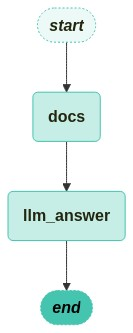

In [14]:
visualize_graph(graph)

- 질문 / 답변

In [17]:
from langchain_core.runnables import RunnableConfig

config = RunnableConfig(configurable={"thread_id" : "1"})   # 스레드 ID 설정

# --------------------첫 질문----------------------
question = "What factors contribute to the scarcity of data on oxygen management in pediatric anesthesia?"

for event in graph.stream(ChatbotState(question=question),config=config):
    print(event)

{'docs': {'documents': [Document(id='b8cb82a5-ab84-4345-93cc-bb8f056c9200', metadata={'document_name': '1-s2.0-S0952818024000333-main.json', 'hypothetical_questions': "1. What was the primary objective of the study on oxygen management in pediatric anesthesia?\n2. How was hyperoxemia defined in this study?\n3. What were the inclusion criteria for patients in the research conducted at Erasmus MC Sophia Children's Hospital?\n4. What statistical methods were used to evaluate the correlation between FiO2 and PaO2?\n5. Why were some patients excluded from the study?", 'page': 2.0, 'summary': "This study investigates intraoperative oxygen administration and hyperoxemia incidence in pediatric anesthesia. Retrospective data were collected from patients aged 0 to 18 years undergoing general anesthesia at Erasmus MC Sophia Children's Hospital, ensuring specific criteria like tracheal intubation, mechanical ventilation, and arterial catheter use were met. Exclusion criteria included conditions li